<a href="https://colab.research.google.com/github/dtuleva/Recipe_Recommendation_System/blob/main/RRS_Experiments.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -q tensorflow-recommenders

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.2/96.2 kB 3.0 MB/s eta 0:00:00


In [2]:
# !pip install -q mlflow

In [3]:
!pip install -U -q tensorboard_plugin_profile

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 15.7 MB/s eta 0:00:00


In [4]:
# !pip install -q scann

In [5]:
from google.colab import drive
drive.mount("/content/gdrive")
# # drive.mount("/content/gdrive", force_remount=True)

Mounted at /content/gdrive


In [6]:
from typing import Dict, Text

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
import tensorflow_recommenders as tfrs

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, IntegerLookup, Embedding, GlobalAveragePooling2D, Dense, Concatenate
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions

from transformers import DistilBertTokenizer, TFDistilBertModel

# import mlflow

# Recipe Recommendation System
## part 4 - Experiments

_Colab Notebook_

## Data pipeline

We read our interactions train, validation and test datasets:

In [7]:
ratings_data = pd.read_csv("/content/gdrive/MyDrive/RRS_interactions/interactions_train.csv")
ratings_data_val = pd.read_csv("/content/gdrive/MyDrive/RRS_interactions/interactions_validation.csv")
ratings_data_test = pd.read_csv("/content/gdrive/MyDrive/RRS_interactions/interactions_test.csv")

In [8]:
# # Mock data for building and debugging
# ratings_data = pd.read_csv("/content/mock-data_interaction_10.csv", nrows = 8)
# ratings_data_val = pd.read_csv("/content/mock-data_interaction_10.csv", skiprows = 9, header = None)
# ratings_data_val.columns = ratings_data.columns

In [9]:
ratings_data

,user_id,recipe_id,rating,dateLastModified
0,3596303,91192,4,1514764999590000000
1,23070809,240784,5,1514766879457000000
2,14211052,20144,5,1514776093630000000
3,15447740,72508,5,1514776413707000000
4,23071592,21014,5,1514776512747000000
...,...,...,...,...
820,3416307,17066,5,1519242786993000000
821,3707225,17066,5,1519248649210000000
822,10277082,21014,5,1519249888430000000
823,22901280,17066,5,1519258308283000000


In [10]:
ratings_data_val

,user_id,recipe_id,rating,dateLastModified
0,22869630,17066,5,1519262844690000000
1,11350130,67952,5,1519271002377000000
2,4156183,162760,5,1519271418750000000
3,21176102,240784,5,1519275955083000000
4,22504692,20171,5,1519283036883000000
...,...,...,...,...
195,4907423,46653,5,1520445068233000000
196,23344238,16383,5,1520448920517000000
197,19277635,162760,5,1520456981883000000
198,22213223,262956,4,1520461031043000000


### Create tensorflow datasets

To achieve faster performance in reading, preprocessing and loading our dataset in the GPU we take advantage of tf.data.AUTOTUNE. It will infer the optimal number of parallel reads and prefetch buffer size for us.

In [11]:
AUTOTUNE = tf.data.AUTOTUNE

We wanted to read our data without pandas, with tensorflow only, but we couldnt make that work with our proto parsing function, so we make our tf.data.Datasets from the pandas dataframes.

In [12]:
# ratings = tf.data.experimental.make_csv_dataset(
#     file_pattern = "./mock-data_interaction_10.csv",
#     batch_size = 1,
#     # column_names=None,
#     # column_defaults=None,
#     # label_name=None,
#     # select_columns=None,
#     # field_delim=',',
#     # use_quote_delim=True,
#     # na_value='',
#     # header=True,
#     num_epochs = 1,
#     # num_epochs=None, # remember to put num epochs in fit!
#     shuffle = True,
#     shuffle_buffer_size = 10000,
#     shuffle_seed = 420042,
#     prefetch_buffer_size = AUTOTUNE,
#     num_parallel_reads = AUTOTUNE,
#     # sloppy=False,
#     # num_rows_for_inference=100,
#     # compression_type=None,
#     # ignore_errors=False,
#     # encoding='utf-8'
# )

In [13]:
ratings = tf.data.Dataset.from_tensor_slices(dict(ratings_data))
ratings_val = tf.data.Dataset.from_tensor_slices(dict(ratings_data_val))


We check what is inside:

In [14]:
for el in ratings.take(1):
  print(el)

{'user_id': <tf.Tensor: shape=(), dtype=int64, numpy=3596303>, 'recipe_id': <tf.Tensor: shape=(), dtype=int64, numpy=91192>, 'rating': <tf.Tensor: shape=(), dtype=int64, numpy=4>, 'dateLastModified': <tf.Tensor: shape=(), dtype=int64, numpy=1514764999590000000>}


In [15]:
ratings_cardinality = ratings.cardinality()
ratings_cardinality

<tf.Tensor: shape=(), dtype=int64, numpy=825>

In [16]:
# # hardcode cardinality because tf.data.experimental.make_csv_dataset does not infer it correctly, even with set number of epochs
# ratings_cardinality = 10
# ratings_cardinality

We iterate through the whole dataset to get the unique user and recipe ids - we will need them for our user and recipe embeddings.

In [17]:
# # if the data were not read with pandas:
# unique_recipe_ids = np.unique(np.concatenate(list(ratings.batch(ratings_cardinality).map(lambda x: x["recipe_id"]))))
# unique_user_ids = np.unique(np.concatenate(list(ratings.batch(ratings_cardinality).map(lambda x: x["user_id"]))))

# with pandas:
unique_recipe_ids = ratings_data.recipe_id.unique()
unique_user_ids = ratings_data.user_id.unique()

print(f"Uniqie recipes: {len(unique_recipe_ids)}\nUnique users: {len(unique_user_ids)}")

Uniqie recipes: 72
Unique users: 819


In [18]:
# timestamps = np.concatenate(list(ratings.map(lambda x: x["dateLastModified"]).batch(ratings_cardinality)))

timestamps = ratings_data.dateLastModified.to_numpy()


max_timestamp = timestamps.max()
min_timestamp = timestamps.min()

print(f"Min timestamp: {pd.to_datetime(min_timestamp)}\nMax timestamp: {pd.to_datetime(max_timestamp)}")

Min timestamp: 2018-01-01 00:03:19.590000
Max timestamp: 2018-02-22 00:37:17.060000


We create a recipe dataset from the unique recipe ids. That will be our candidate pool - the set of recipes from wich we retrieve our recommendations.

In [19]:
recipes = tf.data.Dataset.from_tensor_slices(unique_recipe_ids)

Here we shuffle the data, before mapping any preprocessing functions:

In [20]:
TF_SEED = 42042

In [21]:
# shuffle_buffer_size = 10_000

ratings = ratings.shuffle(buffer_size = ratings.cardinality(), seed = TF_SEED)
ratings_val = ratings_val.shuffle(buffer_size = ratings_val.cardinality(), seed = TF_SEED)
recipes = recipes.shuffle(buffer_size = recipes.cardinality(), seed = TF_SEED)

### Preprocessing functions

Here we have all the preprocessing functions that we map to our datasets. Our pipeline consists the following:
  1. Explicitly name our features to create a dict-like tf dataset in order to remove unused features and ensure there is no name mismatch.
  2. For each observation (line in the dataset) read and parse a proto file that contains the recipe information - name and image. All text features are already tockenized with DistilBERT tokenizer; the images are jpeg encoded. More information on the methods used to create the protofiles in the notebook "Dataset_Manipulation.ipynb".
  3. Decode recipe image, resize it to fixed dimentions and preprocess it with Resnet50's input preprocessor.

In [22]:
def decode_and_preprocess_image(img, image_size = (224, 224)):

    img = tf.io.decode_jpeg(img)
    img = tf.image.resize(img, image_size)
    img = preprocess_input(img) # tensorflow.keras.applications.resnet50.preprocess_input
    # The images are converted from RGB to BGR, then each color channel is zero-centered with respect to the ImageNet dataset, without scaling.

    return img


In [23]:
def parse_proto_example(proto):
    SEQUENCE_LEN = 32
    feature_description = {
      "recipe_id": tf.io.FixedLenFeature([], tf.int64),
      "recipe_name": tf.io.FixedLenFeature([], tf.string),
      "recipe_name_input_ids": tf.io.FixedLenFeature([SEQUENCE_LEN], tf.int64),
      "recipe_name_attention_mask": tf.io.FixedLenFeature([SEQUENCE_LEN], tf.int64),
      "recipe_image": tf.io.FixedLenFeature([], tf.string),
      # "aver_rate": tf.io.FixedLenFeature([], tf.float32),
      # "review_nums": tf.io.FixedLenFeature([], tf.int64),
      # "ingredients": tf.io.FixedLenFeature([], tf.string),
      # "cooking_directions": tf.io.FixedLenFeature([], tf.string),
      # "reviews": tf.io.FixedLenFeature([], tf.string),
    }
    return tf.io.parse_single_example(proto, feature_description)

In [24]:
def read_and_parse_proto_file(recipe_id, dir_path = "/content/gdrive/MyDrive/recipe_proto_files_700/"):

    file_path = dir_path + tf.strings.as_string(recipe_id) + ".proto"
    proto = tf.io.read_file(file_path)

    return parse_proto_example(proto)


In [25]:
def preprocess_recipe_info(element):
      # recipe["recipe_id"]
      # "recipe_name"
      element["recipe_image"] = decode_and_preprocess_image(element["recipe_image"])
      # "aver_rate"
      # "review_nums"
      # "ingredients"
      # "cooking_directions"
      # "reviews"

      return element


In [26]:
def read_original_image(recipe_id):
  img = read_and_parse_proto_file(recipe_id)["recipe_image"]
  img = tf.io.decode_jpeg(img)

  return img

In [27]:
def plot_original_image(recipe_id, ax = None):
  # helper function used only for visualisation of the image before preprocessing
  img = read_and_parse_proto_file(recipe_id)["recipe_image"]
  img = tf.io.decode_jpeg(img)
  ax.imshow(img)

  return ax

We map the datasets to our pipeline functions:

In [28]:
# that would be ratings_train

ratings = ratings.map(lambda x: {
    "recipe_id": x["recipe_id"],
    "user_id": x["user_id"],
    "dateLastModified": x["dateLastModified"],
    **read_and_parse_proto_file(x["recipe_id"]),
    }).map(preprocess_recipe_info)


In [29]:
ratings_val = ratings_val.map(lambda x: {
    "recipe_id": x["recipe_id"],
    "user_id": x["user_id"],
    "dateLastModified": x["dateLastModified"],
    **read_and_parse_proto_file(x["recipe_id"]),
    }).map(preprocess_recipe_info)


In [30]:
recipes = recipes.map(lambda x: {
    **read_and_parse_proto_file(x)
    }).map(preprocess_recipe_info)

In [31]:
# for el in ratings.take(1):
#   [print(f"{k}: {v}") for k, v in el.items()]




In [32]:
# for el in recipes.take(1):
#   print(el)

Let's visualise an example of our dataset in human-readable form and check weather the parsing and preprocess work correctly. The original image is not fed to the model - we use it only for comparison with the preprocessed. Note that matplotlib is not visualising the preprocessed image properly because of the reodered channels and different range (pixel values are neither 0 to 255, nor 0 to 1); and the preprocessed image is not padded, just my visualisation is bad (wanted to show both images with the same scale).

recipe_id: 21014
user_id: 23243105
dateLastModified: 1517694556160000000
recipe_name: b'Good Old Fashioned Pancakes'
recipe_name_attention_mask: [1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
recipe_name_input_ids: [  101  2204  2214 13405 28470   102     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0]


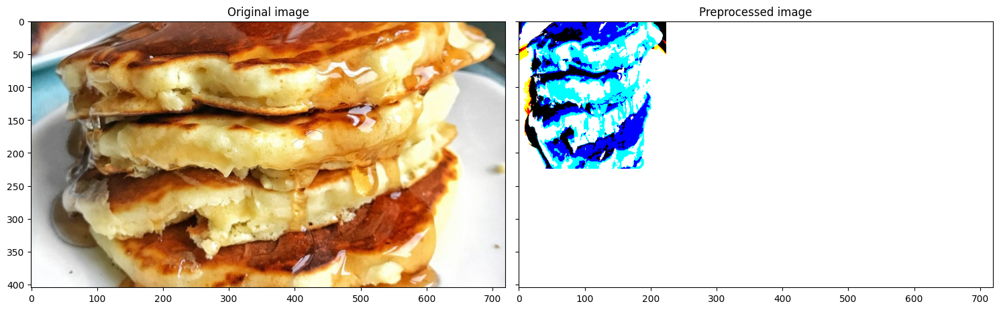

In [33]:
for el in ratings.take(1):
  [print(f"{k}: {v}") for k, v in el.items() if k != "recipe_image"]
  recipe_id = el["recipe_id"]
  image = el["recipe_image"]
  recipe_name = el["recipe_name"]

  # fig, axs = plt.subplots(1,2, figsize=(14, 8))

  fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 7), sharex = True, sharey = True)
  # plt.suptitle(f'User id: {el["user_id"]}\nRating: {5}\nDatestamp: {el["dateLastModified"]}\nRecipe id: {recipe_id}\nRecipe name: {el["recipe_name"]}')

  ax[1].imshow(image)
  plot_original_image(recipe_id, ax = ax[0])


  ax[0].set_title("Original image")
  ax[1].set_title("Preprocessed image")

  # ax[0].text(800, 20, f"Recipe name tockrnized {el['recipe_name_input_ids'].numpy()}")

  plt.tight_layout()
  plt.show()


In [34]:
ratings.cardinality(), ratings_val.cardinality(), recipes.cardinality()

(<tf.Tensor: shape=(), dtype=int64, numpy=825>,
 <tf.Tensor: shape=(), dtype=int64, numpy=200>,
 <tf.Tensor: shape=(), dtype=int64, numpy=72>)

### Configure performance

In [35]:
# def configure_for_performance(ds):
#   ds = ds.cache()
#   ds = ds.shuffle(buffer_size=ds.cardinality())
#   ds = ds.batch(batch_size)
#   ds = ds.prefetch(buffer_size=AUTOTUNE)
#   return ds

In [36]:
# AUTOTUNE = tf.data.AUTOTUNE

# # Set `num_parallel_calls` so multiple images are loaded/processed in parallel.
# dog_muffin_list_train_perf_config = dog_muffin_list_train.map(process_path, num_parallel_calls=AUTOTUNE)
# dog_muffin_list_val_perf_config = dog_muffin_list_val.map(process_path, num_parallel_calls=AUTOTUNE)

In [37]:
# ratings_train = ratings.take(8).batch(BATCH_SIZE)
# ratings_val = ratings.skip(8).take(8).batch(BATCH_SIZE)

In [38]:
BATCH_SIZE = 8
ratings_train = ratings.batch(BATCH_SIZE).prefetch(buffer_size=AUTOTUNE)
ratings_val = ratings_val.batch(BATCH_SIZE).prefetch(buffer_size=AUTOTUNE)

## Model Definition

### Embeddings

In [39]:
EMBEDDING_DIMENSION = 32

#### Id Embedding

https://stackoverflow.com/questions/56786328/keras-layer-with-int-inputs-cannot-be-built

In [40]:
recipe_id_embedding = tf.keras.Sequential([
      tf.keras.layers.IntegerLookup(
          vocabulary=unique_recipe_ids, mask_token=None),
      tf.keras.layers.Embedding(len(unique_recipe_ids) + 1, EMBEDDING_DIMENSION)
    ])

In [41]:
user_id_embedding = tf.keras.Sequential([
        tf.keras.layers.IntegerLookup(
            vocabulary=unique_user_ids, mask_token=None),
        tf.keras.layers.Embedding(len(unique_user_ids) + 1, EMBEDDING_DIMENSION),
    ])

In [42]:
for el in ratings.batch(2).take(1):
  print(f'Recipe id embedding shape: {recipe_id_embedding(el["recipe_id"]).shape}')
  print(f'User id embedding shape: {user_id_embedding(el["user_id"]).shape}')

Recipe id embedding shape: (2, 32)
User id embedding shape: (2, 32)


In [43]:
recipe_id_embedding.output_shape, user_id_embedding.output_shape

((2, 32), (2, 32))

#### Time features

In [44]:
pd.to_datetime(max_timestamp), pd.to_datetime(min_timestamp)


(Timestamp('2018-02-22 00:37:17.060000'),
 Timestamp('2018-01-01 00:03:19.590000'))

In [45]:

timestamp_buckets = np.linspace(min_timestamp, max_timestamp, num = 50) # a bucket almost equal to a day

In [46]:
timestamp_embedding = tf.keras.Sequential([
    tf.keras.layers.Discretization(timestamp_buckets.tolist()),
    tf.keras.layers.Embedding(len(timestamp_buckets) + 1, 32),
])

normalized_timestamp = tf.keras.layers.Normalization(
    axis=None
)

normalized_timestamp.adapt(timestamps)

In [47]:
for el in ratings.batch(2).take(1):
    print(f'Timestamp descrete embedding shape: {timestamp_embedding(el["dateLastModified"]).shape}')
    print(f'Timestamp continious normalised shape: {normalized_timestamp(el["dateLastModified"]).shape}')
    print(normalized_timestamp(el["dateLastModified"]))

Timestamp descrete embedding shape: (2, 32)
Timestamp continious normalised shape: (2,)
tf.Tensor([ 0.7518327  -0.42557937], shape=(2,), dtype=float32)


#### Image Embedding - Resnet50

In [48]:
resnet50 = ResNet50()

102967424/102967424 [==============================] - 1s 0us/step


In [49]:
# resnet50.summary()

In [50]:
sample_images = recipes.map(lambda x: {
    "recipe_image":  x["recipe_image"],
    "original_image": read_original_image(x["recipe_id"]),
  })

sample_images

<_MapDataset element_spec={'recipe_image': TensorSpec(shape=(224, 224, 3), dtype=tf.float32, name=None), 'original_image': TensorSpec(shape=(None, None, None), dtype=tf.uint8, name=None)}>

1/1 [==============================] - 0s 273ms/step


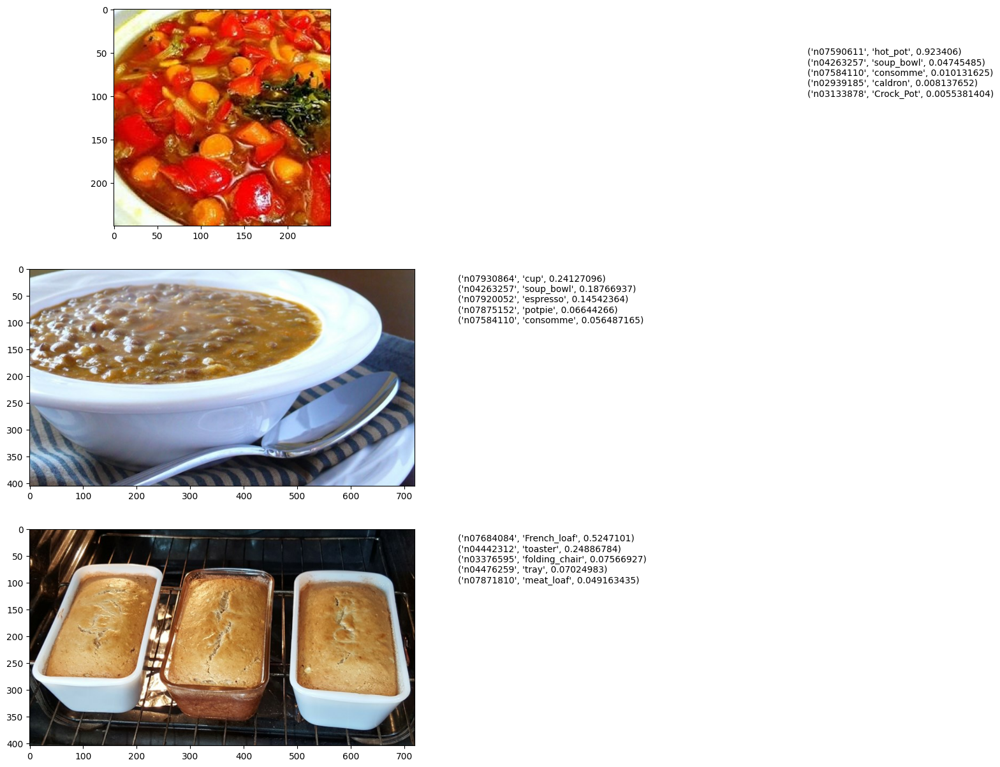

In [51]:
fig, axs = plt.subplots(3, 1, figsize=(8, 15))

for i, img in enumerate(sample_images.take(3)):

  predictions = decode_predictions(resnet50.predict(tf.expand_dims(img["recipe_image"], axis = 0)), top = 5)
  predictions = "\n".join([str(p) for p in predictions[0]])


  axs[i].imshow(img["original_image"])
  axs[i].text(800, 100, str(predictions))


plt.show()


Well, not that accurate, but at leas all labels are food-related, so resnet50 has some idea what it is looking at and is very sure at it - top 1 predictions are with quite high propability.

In [52]:
resnet50_backbone = ResNet50(include_top = False, input_shape = (224, 224, 3))

94765736/94765736 [==============================] - 1s 0us/step


In [53]:
resnet50_backbone.input_shape

(None, 224, 224, 3)

In [54]:
resnet50_backbone.layers[-1].output_shape

(None, 7, 7, 2048)

In [55]:
resnet50_backbone.trainable = False

In [56]:
image_embedding = tf.keras.Sequential(
    layers = [
      Input(shape=(224, 224, 3)),
      resnet50_backbone,
      GlobalAveragePooling2D(),
      Dense(32) # no activation on last dense for embedding
      ],
    name = "image_embedding"
)

In [57]:
image_embedding.summary()

Model: "image_embedding"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d (  (None, 2048)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense (Dense)               (None, 32)                65568     
                                                                 
Total params: 23653280 (90.23 MB)
Trainable params: 65568 (256.12 KB)
Non-trainable params: 23587712 (89.98 MB)
_________________________________________________________________


In [58]:
for el in recipes.batch(1).take(2):
  print(el['recipe_image'].shape)
  print(image_embedding(el['recipe_image']))

(1, 224, 224, 3)
tf.Tensor(
[[-0.6508525  -0.18264021  0.770508   -1.9102154  -1.2258098   0.1291542
  -1.6802615   0.32547528 -0.08464761 -0.09034334 -2.2042067   0.16305134
   2.1166167   0.01577127 -1.6919439  -0.13288552  0.5691977   1.352152
  -0.57742965  0.52407384  0.40691662  1.0043657  -0.83228993  0.77934355
   0.17882831  0.62145454  1.5565096   0.0380489  -2.1458902   0.74189574
  -1.6348054  -1.3935574 ]], shape=(1, 32), dtype=float32)
(1, 224, 224, 3)
tf.Tensor(
[[-0.63172305  0.19078778  1.4410498  -1.8173229   0.4842667  -0.95087665
  -1.2807636   0.7980024   1.2242265  -1.3056898  -2.3450325  -0.31411004
   1.5203623  -0.7713153  -0.15918179 -1.4393972   0.4857696   0.57115114
   0.18956418  0.46292758  0.9074771   0.42094713  0.3216252   0.25857866
  -0.09567809  1.0913378   1.850273    0.99656343 -0.18519881 -1.4232589
  -1.0935724  -1.843131  ]], shape=(1, 32), dtype=float32)


#### Text Embedding - DistillBert

In [59]:
dbert_model = TFDistilBertModel.from_pretrained('distilbert-base-uncased')

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFDistilBertModel: ['vocab_transform.bias', 'vocab_projector.bias', 'vocab_layer_norm.weight', 'vocab_transform.weight', 'vocab_layer_norm.bias']
- This IS expected if you are initializing TFDistilBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFDistilBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFDistilBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFDistilBertModel for predictions without further training.


In [60]:
dbert_model.summary()

Model: "tf_distil_bert_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 distilbert (TFDistilBertMa  multiple                  66362880  
 inLayer)                                                        
                                                                 
Total params: 66362880 (253.15 MB)
Trainable params: 66362880 (253.15 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [61]:
dbert_tokenizer = DistilBertTokenizer.from_pretrained("distilbert-base-uncased")

tokenizer_config.json:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

In [62]:
recipe_names = recipes.map(lambda x: x["recipe_name"])

In [63]:
sample_names_input = []
for el in recipe_names.take(2):
  print(el)
  string_value = tf.compat.as_str_any(el.numpy())
  print(string_value)
  tokenized_input = dbert_tokenizer(string_value, add_special_tokens = True, max_length = 124, padding = "max_length", truncation = True)
  print(tokenized_input)
  sample_names_input.append(tokenized_input)
  print(dbert_tokenizer.decode(tokenized_input["input_ids"]))

tf.Tensor(b'Grilled Fish Tacos with Chipotle-Lime Dressing', shape=(), dtype=string)
Grilled Fish Tacos with Chipotle-Lime Dressing
{'input_ids': [101, 26192, 2094, 3869, 11937, 13186, 2007, 9090, 4140, 2571, 1011, 14123, 11225, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'attention_mask': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}
[CLS] grilled fish tacos with chipotle - li

In [64]:
def tokenize_and_encode(sentence):
    tokens = dbert_tokenizer.encode_plus(sentence.numpy().decode('utf-8'), padding='max_length', truncation=True, max_length=64, return_tensors='tf')
    return {
        'input_ids': tokens['input_ids'][0],
        'attention_mask': tokens['attention_mask'][0],
    }

In [65]:
tokenized_names = recipes.map(lambda x: (x["recipe_name_input_ids"], x["recipe_name_attention_mask"]))

In [66]:
for recipe in tokenized_names.take(2):
  print(dbert_tokenizer.decode(recipe[0]))

[CLS] oven roasted potatoes [SEP] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD]
[CLS] graham cracker crust i [SEP] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD]


In [67]:
# for el in ingredients.take(2):
#   print(el)
#   string_value = tf.compat.as_str_any(el.numpy())
#   print(string_value)
#   tokenized_input = dbert_tokenizer(string_value)
#   print(tokenized_input)
#   print(dbert_tokenizer.decode(tokenized_input["input_ids"]))

In [68]:
max_len = 32
inps = Input(shape = (max_len,), dtype='int64')
masks= Input(shape = (max_len,), dtype='int64')
dbert_layer = dbert_model(inps, attention_mask=masks)[0][:,0,:]
# dense = Dense(254, activation = "relu")(dbert_layer)
# dense = Dense(32)(dense)
dense = Dense(32)(dbert_layer)
recipe_name_embedding = tf.keras.Model(inputs=[inps,masks], outputs=dense, name = "recipe_name_embedding")

recipe_name_embedding.summary()

Model: "recipe_name_embedding"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 32)]                 0         []                            
                                                                                                  
 input_5 (InputLayer)        [(None, 32)]                 0         []                            
                                                                                                  
 tf_distil_bert_model (TFDi  TFBaseModelOutput(last_hid   6636288   ['input_4[0][0]',             
 stilBertModel)              den_state=(None, 32, 768),   0          'input_5[0][0]']             
                              hidden_states=None, atten                                           
                             tions=None)                                      

In [69]:
for layer in recipe_name_embedding.layers:
  print(layer.name)

input_4
input_5
tf_distil_bert_model
tf.__operators__.getitem
dense_1


In [70]:
for el in ratings.batch(2).take(1):
  result = recipe_name_embedding((el['recipe_name_input_ids'], el['recipe_name_attention_mask']))
  print(result.shape)

(2, 32)


### Query model

In [71]:
# # query tower

# user_model = Sequential([
#   IntegerLookup(
#       vocabulary=unique_user_ids, mask_token=None),
#   # We add an additional embedding to account for unknown tokens.
#   tf.keras.layers.Embedding(len(unique_user_ids) + 1, embedding_dimension)
# ])

In [72]:
class UserModel(tf.keras.Model):

  def __init__(self, vocabulary_user_id, timestamps):
    super().__init__()

    max_timestamp = timestamps.max()
    min_timestamp = timestamps.min()
    timestamp_buckets = np.linspace(min_timestamp, max_timestamp, num=1000)

    self.user_embedding = tf.keras.Sequential([

        tf.keras.layers.IntegerLookup(
            vocabulary=vocabulary_user_id, mask_token=None),
        tf.keras.layers.Embedding(len(vocabulary_user_id) + 1, 32),
    ])


    self.timestamp_embedding = tf.keras.Sequential([
        tf.keras.layers.Discretization(timestamp_buckets.tolist()),
        tf.keras.layers.Embedding(len(timestamp_buckets) + 1, 32),
    ])

    self.normalized_timestamp = tf.keras.layers.Normalization(axis=None)

    self.normalized_timestamp.adapt(timestamps)


  def call(self, inputs):

    return tf.concat([
        self.user_embedding(inputs["user_id"]),
        self.timestamp_embedding(inputs["dateLastModified"]),
        tf.reshape(self.normalized_timestamp(inputs["dateLastModified"]), (-1, 1)),
    ], axis=1)

In [73]:
user_model = UserModel(unique_user_ids, timestamps)

In [74]:
for el in ratings.batch(3).take(1):
  print(user_model(el).shape)

(3, 65)


In [75]:
user_model.summary()

Model: "user_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_3 (Sequential)   (3, 32)                   26240     
                                                                 
 sequential_4 (Sequential)   (3, 32)                   32032     
                                                                 
 normalization_1 (Normaliza  multiple                  3         
 tion)                                                           
                                                                 
Total params: 58275 (227.64 KB)
Trainable params: 58272 (227.62 KB)
Non-trainable params: 3 (16.00 Byte)
_________________________________________________________________


### Candidate model

In [76]:
class RecipeModel(tf.keras.Model):

  def __init__(self, vocabulary_recipe_id):
    super().__init__()

    self.id_embedding = tf.keras.Sequential(name = "recipe_id_embedding",
        layers = [
          tf.keras.layers.IntegerLookup(
              vocabulary=vocabulary_recipe_id, mask_token=None),
          tf.keras.layers.Embedding(len(unique_recipe_ids) + 1, 32)
      ])

    self.image_embedding = tf.keras.Sequential( name = "image_embedding",
        layers = [
          Input(shape=(224, 224, 3)),
          ResNet50(include_top = False, input_shape = (224, 224, 3)),
          GlobalAveragePooling2D(),
          Dense(32) # no activation on last dense for embedding
      ])


    self.recipe_name_embedding = recipe_name_embedding

  def call(self, inputs):
    return tf.concat([
        self.id_embedding(inputs["recipe_id"]),
        self.recipe_name_embedding((inputs["recipe_name_input_ids"], inputs["recipe_name_attention_mask"])),
        self.image_embedding(inputs["recipe_image"]),
    ], axis=1)

In [77]:
recipe_model = RecipeModel(unique_recipe_ids)

In [78]:
for el in recipes.batch(3).take(1):
  print(recipe_model(el).shape)

(3, 96)


In [79]:
recipe_model.summary()

Model: "recipe_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 recipe_id_embedding (Seque  (3, 32)                   2336      
 ntial)                                                          
                                                                 
 image_embedding (Sequentia  (None, 32)                23653280  
 l)                                                              
                                                                 
 recipe_name_embedding (Fun  (None, 32)                66387488  
 ctional)                                                        
                                                                 
Total params: 90043104 (343.49 MB)
Trainable params: 89989984 (343.28 MB)
Non-trainable params: 53120 (207.50 KB)
_________________________________________________________________


In [80]:
for el in recipes.batch(10).take(1):
  print(el["recipe_id"])

tf.Tensor([ 20171  16947   7095 262370  72508  20963 137650 234536 261337 262506], shape=(10,), dtype=int64)


### Two tower model

In [81]:
recipes.cardinality()

<tf.Tensor: shape=(), dtype=int64, numpy=72>

In [82]:
# for el in recipes.batch(72).take(1):
#   print(el)

In [83]:
class RecipeRecommedModel(tfrs.models.Model):

  def __init__(self, vocabulary_user_id, timestamps, vocabulary_recipe_id, freeze_backbones = True):
    super().__init__()

    self.query_model = tf.keras.Sequential(name = "query_model", layers = [
      UserModel(vocabulary_user_id, timestamps),
      # Dense(32, activation = "relu"),
      Dense(16)
    ])

    self.candidate_model = tf.keras.Sequential(name = "candidate_model", layers = [
      RecipeModel(vocabulary_recipe_id),
      # Dense(32, activation = "relu"),
      Dense(16)
    ])

    self.retrieval_task = tfrs.tasks.Retrieval(
        metrics=tfrs.metrics.FactorizedTopK(
            candidates = recipes.batch(72).map(self.candidate_model), # all candidates in one batch
            ks = (1, 5, 10, 20), # default (1, 5, 10, 50, 100),
        ),
    )

    self.ranking_task = tfrs.tasks.Ranking(   # no ranking implementation for now
        loss=tf.keras.losses.MeanSquaredError(),
        metrics=[tf.keras.metrics.RootMeanSquaredError()],
    )

    if freeze_backbones:
      self.candidate_model.layers[0].image_embedding.layers[0].trainable = False # resnet50
      self.candidate_model.layers[0].recipe_name_embedding.layers[2].trainable = False # distilbert


  def compute_loss(self, features, training=False):

    query_embeddings = self.query_model({
        "user_id": features["user_id"],
        "dateLastModified": features["dateLastModified"],
    })
    recipe_embeddings = self.candidate_model({
        "recipe_id": features["recipe_id"],
        "recipe_name_input_ids": features["recipe_name_input_ids"],
        "recipe_name_attention_mask": features["recipe_name_attention_mask"],
        "recipe_image": features["recipe_image"],
    })

    return self.retrieval_task(query_embeddings, recipe_embeddings)


  def call(self, features): # does nothing; need it for the summary
    query_embeddings = self.query_model({
        "user_id": features["user_id"],
        "dateLastModified": features["dateLastModified"],
    })
    recipe_embeddings = self.candidate_model({
        "recipe_id": features["recipe_id"],
        "recipe_name_input_ids": features["recipe_name_input_ids"],
        "recipe_name_attention_mask": features["recipe_name_attention_mask"],
        "recipe_image": features["recipe_image"],
    })

    return tf.concat([query_embeddings, recipe_embeddings], axis = 1)



## Model training

### Callback setup

In [89]:
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir = "/content/gdrive/MyDrive/RSS_logs/tensorboard_adagrad_01/",
                                      histogram_freq = 1, # frequency (in epochs) at which to compute weight histograms for the layers of the model
                                      embeddings_freq = 1, # in epochs
                                      # profile_batch = "2, 4" #  A pair of positive integers signify a range of batches to profile
                                    )

In [90]:
model_chekpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    "/content/gdrive/MyDrive/RSS_logs/model_checkpoint_adagrad_01/checkpoint_adagrad_01.ckpt",
    save_best_only = False,
    save_weights_only = True, # cannot save model without bilding it first,
                              # cannot be build without config (non serializable innit arguments - distilbert backbone left outside the class
                              # and the unuque id and timestamp arrays)
    vesbose = 1,
    save_freq = 'epoch',
)

In [91]:
# Load the TensorBoard notebook extension.
%load_ext tensorboard

# %reload_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [92]:
%tensorboard --logdir="./gdrive/MyDrive/RSS_logs/tensorboard_adagrad_01/"


Reusing TensorBoard on port 6006 (pid 1630), started 0:01:13 ago. (Use '!kill 1630' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
# experiment = mlflow.create_experiment("retrieval_final")

In [ ]:
# experiment

# 378239632256356911

'800010675090384808'

In [ ]:
# mlflow.autolog()
# # mlflow.autolog(disable = True)

2024/02/08 10:41:23 INFO mlflow.tracking.fluent: Autologging successfully enabled for transformers.
2024/02/08 10:41:23 INFO mlflow.tracking.fluent: Autologging successfully enabled for tensorflow.
2024/02/08 10:41:24 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


### Training

In [93]:
tf.keras.backend.clear_session()

In [94]:
model = RecipeRecommedModel(unique_user_ids, timestamps, unique_recipe_ids)
# model.compile(optimizer=tf.keras.optimizers.Adam(0.01))
model.compile(optimizer = tf.keras.optimizers.Adagrad(0.1))

In [95]:
# latest_checkpoint = tf.train.latest_checkpoint("/content/gdrive/MyDrive/RSS_logs/final_model_checkpoint/")
# latest_checkpoint

In [96]:
# model.load_weights(latest_checkpoint)

In [97]:
assert model.candidate_model.layers[0].image_embedding.layers[0].trainable is False   # frozen resnet50 backbone
assert model.candidate_model.layers[0].image_embedding.layers[1].trainable is True    # layer after backbone is trainable
model.candidate_model.layers[0].image_embedding.layers[0]

In [98]:
assert model.candidate_model.layers[0].recipe_name_embedding.layers[2].trainable is False # frozen distillbert backbone
assert model.candidate_model.layers[0].recipe_name_embedding.layers[3].trainable is True  # layer after backbone is trainable
model.candidate_model.layers[0].recipe_name_embedding.layers[2]

In [99]:
# # for trying stuff only
# BATCH_SIZE = 2
# ratings_train = ratings.take(8).batch(BATCH_SIZE)
# ratings_val = ratings.skip(8).take(8).batch(BATCH_SIZE)

In [100]:
# with mlflow.start_run(experiment_id = experiment, run_name="autolog_initial") as run:
history = model.fit(
    ratings_train,
    validation_data = ratings_val,
    epochs = 6,
    initial_epoch = 0,
    callbacks = [tensorboard_callback, model_chekpoint_callback],
    )

Epoch 1/6
104/104 [==============================] - 1866s 18s/step - factorized_top_k/top_1_categorical_accuracy: 0.0145 - factorized_top_k/top_5_categorical_accuracy: 0.0909 - factorized_top_k/top_10_categorical_accuracy: 0.1697 - factorized_top_k/top_20_categorical_accuracy: 0.3079 - root_mean_squared_error: 0.0000e+00 - loss: 65.0334 - regularization_loss: 0.0000e+00 - total_loss: 65.0334 - val_factorized_top_k/top_1_categorical_accuracy: 0.0100 - val_factorized_top_k/top_5_categorical_accuracy: 0.0600 - val_factorized_top_k/top_10_categorical_accuracy: 0.1950 - val_factorized_top_k/top_20_categorical_accuracy: 0.2400 - val_root_mean_squared_error: 0.0000e+00 - val_loss: 40.3066 - val_regularization_loss: 0.0000e+00 - val_total_loss: 40.3066
Epoch 2/6
104/104 [==============================] - 1805s 17s/step - factorized_top_k/top_1_categorical_accuracy: 0.0400 - factorized_top_k/top_5_categorical_accuracy: 0.2558 - factorized_top_k/top_10_categorical_accuracy: 0.4121 - factorized_

First attempt of training the model with adam optimizer and learning rate 0.1 ended gloriously when we found that the training loss is going up with each epoch:

Epoch 1/10: loss: 18985.8487

Epoch 2/10: loss: 150229.9285

Epoch 3/10: loss: 186910.4055

We stopped thet, reinitialised the model and tried with smaller initial learning rate.

Second attempt with adam 0,06;

Epoch 1/10: loss: 3094.5176

Epoch 2 went up to 18044.2807 pretty fast and we stopped that too.
Reloaded the model weights from epoch 1 (hoping that this would be better than random, not that it is a very good state) and tried with even smaller initial learning rate, result was rising loss argain.

After several attempts with adam with different learning rates, we changed the optimiser to adagrad leading to falling loss and rising metrics, after several trial and errors there is the final experiment:

Attempt N: Model reinitialized with random weights and adagrad 0.1. And of course, why not, we'e exausted our colab resourses and session was disconected 58 seconds before the last epoch, and why not, there's something fishy going on with tensorflow, the train loss is missing from the logs. Sooo here it is, the training history of the loss, TYPED, value by value, like that...


## Evaluation

In [108]:
loss = [65.0334, 24.7481, 10.1033, 5.6737, 3.3216, 3.2151]
val_loss = model.history.history["val_loss"]

history_ = {"loss": loss, "val_loss": val_loss}

In [117]:
model.history.history["total_loss"]

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]

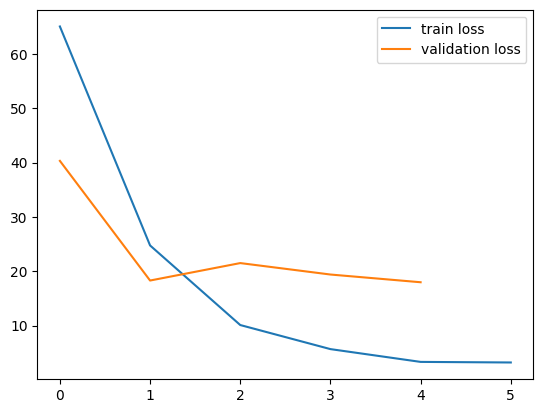

In [118]:
# plt.plot(history.history["loss"])
# plt.plot(history.history["val_loss"])
plt.plot(history_["loss"], label = "train loss")
plt.plot(history_["val_loss"], label = "validation loss")
plt.legend()

plt.show()

In [121]:
model.history.history.keys()

dict_keys(['factorized_top_k/top_1_categorical_accuracy', 'factorized_top_k/top_5_categorical_accuracy', 'factorized_top_k/top_10_categorical_accuracy', 'factorized_top_k/top_20_categorical_accuracy', 'root_mean_squared_error', 'loss', 'regularization_loss', 'total_loss', 'val_factorized_top_k/top_1_categorical_accuracy', 'val_factorized_top_k/top_5_categorical_accuracy', 'val_factorized_top_k/top_10_categorical_accuracy', 'val_factorized_top_k/top_20_categorical_accuracy', 'val_root_mean_squared_error', 'val_loss', 'val_regularization_loss', 'val_total_loss'])

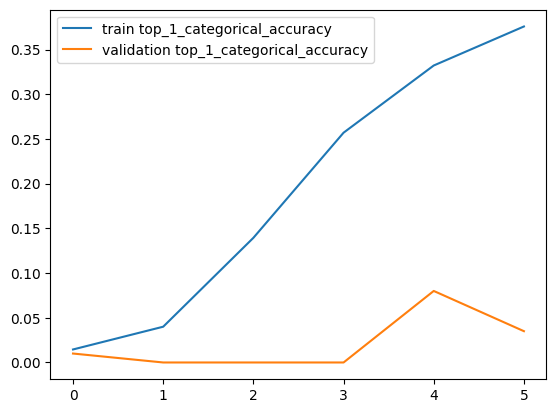

In [127]:
plt.plot(model.history.history["factorized_top_k/top_1_categorical_accuracy"], label = "train top_1_categorical_accuracy")
plt.plot(model.history.history["val_factorized_top_k/top_1_categorical_accuracy"], label = "validation top_1_categorical_accuracy")

plt.legend()

plt.show()

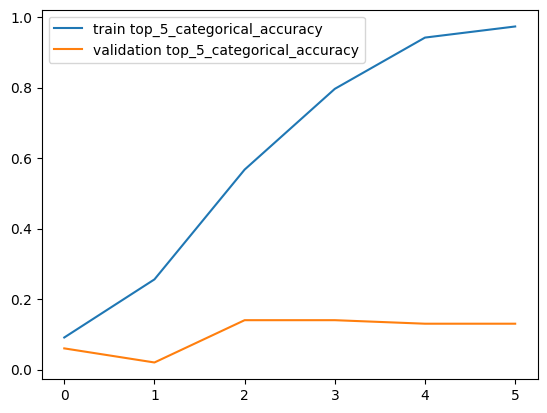

In [124]:
plt.plot(model.history.history["factorized_top_k/top_5_categorical_accuracy"], label = "train top_5_categorical_accuracy")
plt.plot(model.history.history["val_factorized_top_k/top_5_categorical_accuracy"], label = "validation top_5_categorical_accuracy")

plt.legend()

plt.show()

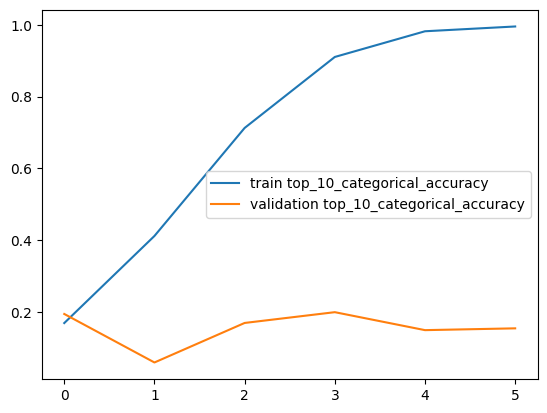

In [130]:
plt.plot(model.history.history["factorized_top_k/top_10_categorical_accuracy"], label = "train top_10_categorical_accuracy")
plt.plot(model.history.history["val_factorized_top_k/top_10_categorical_accuracy"], label = "validation top_10_categorical_accuracy")

plt.legend()

plt.show()

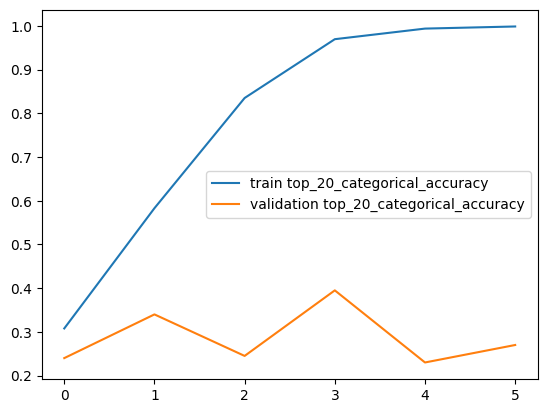

In [129]:
plt.plot(model.history.history["factorized_top_k/top_20_categorical_accuracy"], label = "train top_20_categorical_accuracy")
plt.plot(model.history.history["val_factorized_top_k/top_20_categorical_accuracy"], label = "validation top_20_categorical_accuracy")

plt.legend()

plt.show()

We can see that the model overfitted somewhere before epoch 2, while keeping overall not that good top k accuracy. Conclusion - our model has no idea what is going on in the validation set - which is expected, since we know there are too many unseen users there and also several recipes that are not even the candiate pool.

In [131]:
for el in ratings.batch(1).take(1):
    print(model(el))

tf.Tensor(
[[ 6.8243288e-02  3.0926013e-01  7.3489845e-02  4.8655529e-02
   2.2345039e-01  1.4746192e-01  3.0111983e-02 -2.2190195e-01
  -2.8863072e-01 -1.3990267e-01  1.9510005e-02 -6.0622655e-02
  -2.6512824e-02 -6.2404297e-02 -1.9372024e-01  9.9265635e-02
   7.6659431e+00  8.9934092e+00 -1.9209697e+00 -2.4949896e+01
   1.1344542e+01  1.2767396e+00 -1.7392123e+00 -4.9549451e+00
  -2.2423301e+00  7.8542418e+00 -3.2321060e+00 -1.6228474e+00
  -4.0788651e+00 -8.8353282e-01  4.2724948e+00  4.7315726e+00]], shape=(1, 32), dtype=float32)


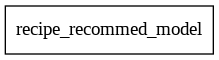

In [132]:
tf.keras.utils.plot_model(model, show_shapes=True, expand_nested = True) # very helpful

In [133]:
model.summary(expand_nested = False)

Model: "recipe_recommed_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 query_model (Sequential)    multiple                  59331     
                                                                 
 candidate_model (Sequentia  multiple                  90044656  
 l)                                                              
                                                                 
 retrieval (Retrieval)       multiple                  1         
                                                                 
 ranking (Ranking)           multiple                  0 (unused)
                                                                 
Total params: 90103988 (343.72 MB)
Trainable params: 153392 (599.19 KB)
Non-trainable params: 89950596 (343.13 MB)
_________________________________________________________________


We know that the model is good for nothing and the work in creating the multiple test sets we have planned (user coldstart, recipe coldstart, both) is just not worth it. Of course we need to revert the model's state at the end of epoch 1 and  evaluate of the general test set, but something's fishy with the model checkpoints, so better not.

## Making recommendations

Let us see is we can train a layer for makig predictions:

In [134]:
# black magic
brute_force_index = tfrs.layers.factorized_top_k.BruteForce(model.query_model, k=5)
brute_force_index.index_from_dataset(
  tf.data.Dataset.zip(ratings_train.map(lambda x: x["recipe_id"]), ratings_train.map(model.candidate_model))
)


In [150]:
# black magic
for el in ratings_train.take(1):
    # # print(el)
    # print(el['recipe_id'], el['user_id'])
    # print(model.query_model(el))
    # print(model.candidate_model(el))
    user_ids = el['user_id']
    recommendatios = brute_force_index(el)[1]
    # print(loaded_brute(el))

First thing to note about the recommendation generation is that our model expects all features of the train set in the prompt which is rather unwanted and needs fixing, but all attempts were unsucsessful. Also since the train set is maped to the candidate model, we have duplicates in the pool and thus duplicates in the recommendations for one user. Mapping it to the recipes set leads to wild shape mismatch errors. Out of sheer curiosity let's see the names of few reccomended recipes:

In [153]:
for user, rec in zip(user_ids.numpy(), recommendatios.numpy()):
  print(f"User id {user}")
  for recipe in rec:
    recipe_details = read_and_parse_proto_file(recipe)
    print(recipe_details["recipe_name"].numpy())
  print("-------------")

User id 8527971
b'Kentucky Biscuits'
b'Good Old Fashioned Pancakes'
b'Sauteed Radishes'
b'Best Marinara Sauce Yet'
b'Quick and Easy Pizza Crust'
-------------
User id 20847568
b'Fluffy Pancakes'
b'Banana Banana Bread'
b'Greek Lentil Soup (Fakes)'
b"Diane's Colcannon"
b'Roasted Brussels Sprouts'
-------------
User id 22777245
b'Kentucky Biscuits'
b'Good Old Fashioned Pancakes'
b'Sauteed Radishes'
b'Best Marinara Sauce Yet'
b'Quick and Easy Pizza Crust'
-------------
User id 15705558
b'Good Old Fashioned Pancakes'
b'Fluffy Pancakes'
b'Fluffy Pancakes'
b'Kentucky Biscuits'
b'Yummy Sweet Potato Casserole'
-------------
User id 11354747
b'French Onion Soup Gratinee'
b'Good Old Fashioned Pancakes'
b'Fluffy Pancakes'
b'Amazingly Easy Irish Soda Bread'
b'Good Old Fashioned Pancakes'
-------------
User id 8991714
b'Salmon with Lemon and Dill'
b'Fluffy Pancakes'
b'Quick and Easy Pizza Crust'
b'Fluffy Pancakes'
b'Good Old Fashioned Pancakes'
-------------
User id 21281122
b'The Best Vegetarian Ch

Can't infer anything from this, just random recipes (with duplicates); and we have no easy way to compare recomendations with user history so we leave it at that.

In [137]:
SAVED_MODEL_PATH = "./brute"

In [ ]:
tf.saved_model.save(brute_force_index, SAVED_MODEL_PATH)

In [ ]:
# loaded_brute = tf.saved_model.load(SAVED_MODEL_PATH)

And we wanted to make predictions faster with scann - library for efficient aproximate nearest neighbour serarch - but since our model does nothing there is no need to do nothing more efficiently.

In [ ]:
# scann_index = tfrs.layers.factorized_top_k.ScaNN(
#     query_model = model.query_model,
#     k = 5,
#     # distance_measure: Text = 'dot_product',
#     num_leaves = 5,
#     num_leaves_to_search = 1,
#     # training_iterations: int = 12,
#     dimensions_per_block = 2,
#     num_reordering_candidates = 10,
#     # parallelize_batch_searches: bool = True,
#     name = "scann_index",

#     )
# scann_index.index_from_dataset(
#   tf.data.Dataset.zip(ratings_train.repeat(3).map(lambda x: x["recipe_id"]), ratings_train.repeat(3).map(model.candidate_model))
# )


In [ ]:
# for el in ratings_train.take(2):
#     # # print(el)
#     # print(el['recipe_id'], el['user_id'])
#     # print(model.query_model(el))
#     # print(model.candidate_model(el))
#     print(scann_index(el))
#     # print(loaded_brute(el))

## Conclusion

Let's wrap it up, we're embarassed ourselves enough already. Main findings of this work are:

1. We've severely underestimated the computational ressources needed for the task we've chosen.
2. Scaling down into oblivion made us loose all hopes of statistical validity of our methods.
3. Pretty tutorials make the task look deceivingly easy.
4. Results are not even worth commenting
5. Recommendation is spelled with double m, not double c!


Proposed approaches to somewhat fix the mess:

1. Pre-training of all huge embeddings (image and text) on some general task, alowing for more decent architecture and not stiching the gazillion parameter last layers of the backbones to a mere Dense(32). Maybe even saving pre-computed embeddings into an efficient TFRecord dataset

2. Take the time to add all text features - why use big model as distillBERT if we are going to use the recipe names only, it is not that good at random words (and titles) anyway, it is supposed to encode senteces after all...

3. Make a train set and candidate pool with valid statistical metods, or at least apply some buisness logic when filtering the enourmus dataset.

4. Construct the model in such a way that it could be saved and exported - maybe use hashing layer instead of integer lookup (so no need to keep track of vocabularies), initialize the timestamp normalisation layer with fixed mean and std - if the dataset is too large they would be hard to infer anyway and finally put the distillbert backbone constructor inside the class, duh.

5. And last, but not least - read a bit more and try to find a working example of the monstrosity we're trying to create.


Thank you for bearing with me throughout this journey of _trying_ to create a Recipe Recommendation System.



